In [1]:
import os

import pandas as pd

"""
00 - Configuration
"""

df = pd.read_feather("../../../data/processed/8.8_ajo/yolo/2_mbps/yolo_qos.feather")

In [36]:
"""
Quick plot to partially visualize the data.
"""
import seaborn as sns
import matplotlib.pyplot as plt
# df = pd.read_feather("../../../data/processed/11.7_yolo_20_consumer/yolo_qos.feather")
sns.scatterplot(y="queue", x="start_time", hue="source", data=df)
plt.semilogy()
# sns.scatterplot(y="queue", x="Unnamed: 0", data=df)
plt.savefig("yolo_queue.png")
# df.plot.scatter(y=df.queue, x=df.index)

ValueError: Could not interpret value `start_time` for parameter `x`

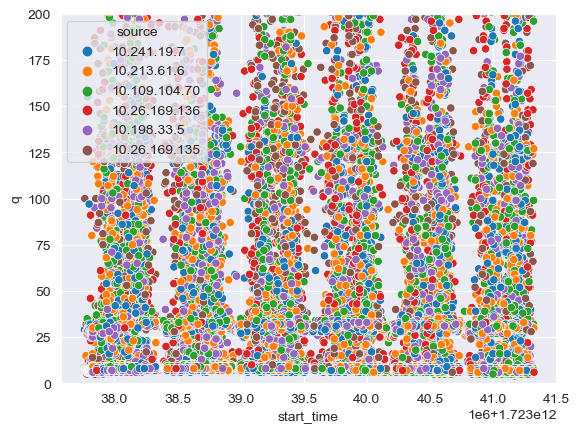

In [3]:
import seaborn as sns
import matplotlib.pyplot as plt
df2 = df.copy()
df2["q"] = df2["end_time"] - df2["start_time"]
sns.scatterplot(y="q", x="start_time", hue="source", data=df2)
plt.ylim(0,200)
# sns.scatterplot(y="queue", x="Unnamed: 0", data=df)
plt.savefig("yolo_queue.png")
# df.plot.scatter(y=df.queue, x=df.index)

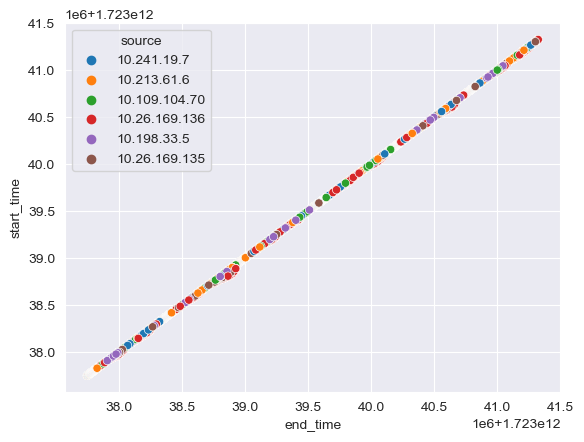

In [4]:
import seaborn as sns
import matplotlib.pyplot as plt
df2 = df.copy()
df2["q"] = df2["end_time"] - df2["start_time"]
sns.scatterplot(y="start_time", x="end_time", hue="source", data=df2)
# plt.ylim(0,200)
# sns.scatterplot(y="queue", x="Unnamed: 0", data=df)
plt.savefig("yolo_queue.png")
# df.plot.scatter(y=df.queue, x=df.index)

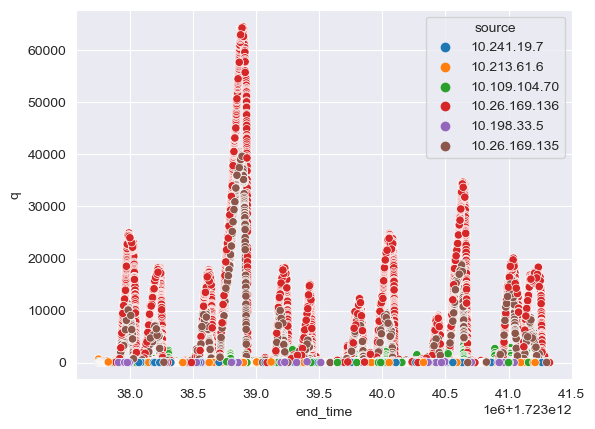

In [5]:
import seaborn as sns
import matplotlib.pyplot as plt
df2 = df.copy()
df2["q"] = df2["end_time"] - df2["start_time"]
sns.scatterplot(y="q", x="end_time", hue="source", data=df2)
# plt.ylim(0,200)
# sns.scatterplot(y="queue", x="Unnamed: 0", data=df)
plt.savefig("yolo_queue.png")
# df.plot.scatter(y=df.queue, x=df.index)

/u/63/kettunr3/unix/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


<Axes: xlabel='Proportion', ylabel='q'>

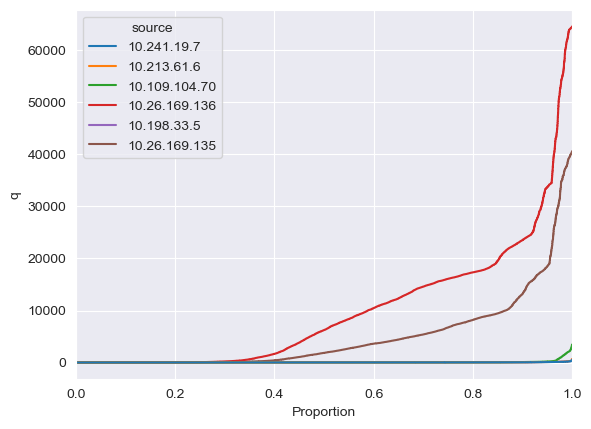

In [6]:
import seaborn as sns
import matplotlib.pyplot as plt
# df = pd.read_feather("../../../data/processed/11.7_yolo_20_consumer/yolo_qos.feather")
df2 = df.copy()
df2["q"] = df2["end_time"] - df2["start_time"]
# sns.ecdfplot(y="start_time", hue="source", data=df2)
# plt.show()
# sns.ecdfplot(y="end_time", hue="source", data=df2)
# plt.show()
sns.ecdfplot(y="q", hue="source", data=df2)


In [7]:
import pandas as pd
import plotly.express as px

# Assuming "yolo_qos.feather" contains the necessary columns ("queue", "start_time", "source")

# Load the data
# df = pd.read_feather("yolo_qos.feather")

# Create an interactive scatter plot with logarithmic scale for the y-axis using Plotly
fig = px.scatter(df, x="start_time", y="queue", color="source",
                 symbol="source", symbol_map={"source": "circle"},
                 title="Queue vs. Start Time",
                 labels={"start_time": "Start Time", "queue": "Queue"},
                 log_y=True)

# Show the plot
fig.show()

In [8]:
import pandas as pd
import bokeh
from bokeh.plotting import figure, show
from bokeh.models import ColumnDataSource
from bokeh.io import output_notebook
output_notebook()

# Load the data
# df = pd.read_feather("yolo_qos.feather")

# Create a ColumnDataSource
source = ColumnDataSource(df)

# Create an interactive scatter plot with log scale for the y-axis using Bokeh
p = figure(title="Queue vs. Start Time", x_axis_label="Start Time", y_axis_label="Queue", y_axis_type="log")
p.circle(x='start_time', y='queue', source=source, color='source', legend_field='source')
show(p)

Loading BokehJS ...

In [9]:
import pandas as pd
import altair as alt
alt.data_transformers.enable("vegafusion")  # Without this, max rows is 5000

# Load the data
# df = pd.read_feather("yolo_qos.feather")

# Create an interactive scatter plot with log scale for the y-axis using Altair
chart = alt.Chart(df).mark_circle().encode(
    x='start_time',
    y=alt.Y('queue', scale=alt.Scale(type='log')),
    color='source'
).properties(
    title='Queue vs. Start Time',
    width=600,
    height=400
)
chart

NoSuchEntryPoint: No 'vegafusion' entry point found in group 'altair.vegalite.v5.data_transformer'